In [ ]:
# !mkdir -p ~/.kaggle
# !mv kaggle.json ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json

The syntax of the command is incorrect.


'mv' is not recognized as an internal or external command,
operable program or batch file.
'chmod' is not recognized as an internal or external command,
operable program or batch file.


In [ ]:
# !kaggle datasets download -d sartajbhuvaji/brain-tumor-classification-mri -p /dataset

Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "d:\Brain_Tumor_Detection\.venv\Scripts\kaggle.exe\__main__.py", line 7, in <module>
  File "d:\Brain_Tumor_Detection\.venv\Lib\site-packages\kaggle\cli.py", line 68, in main
    out = args.func(**command_args)
          ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "d:\Brain_Tumor_Detection\.venv\Lib\site-packages\kaggle\api\kaggle_api_extended.py", line 1734, in dataset_download_cli
    with self.build_kaggle_client() as kaggle:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "d:\Brain_Tumor_Detection\.venv\Lib\site-packages\kaggle\api\kaggle_api_extended.py", line 688, in build_kaggle_client
    username=self.config_values['username'],
             ~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^
KeyError: 'username'


In [37]:
#!/bin/bash
!kaggle datasets download sartajbhuvaji/brain-tumor-classification-mri -p ../dataset

Dataset URL: https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri
License(s): MIT


In [39]:
import zipfile
import os

zip_path = r"../dataset/brain-tumor-classification-mri.zip"  # Adjust path if necessary
extract_path = r"../dataset/tumor"

# Ensure the destination folder exists
os.makedirs(extract_path, exist_ok=True)

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction complete!")


Extraction complete!


In [ ]:
# !unzip /dataset/brain-tumor-classification-mri.zip -d /dataset/tumor

'unzip' is not recognized as an internal or external command,
operable program or batch file.


In [ ]:
import os, shutil
import random
import numpy as np
import pandas as pd
import cv2
import skimage
import skimage.segmentation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('ggplot')

In [ ]:
labels = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']
img_size = 128

def get_data(data_dir):
  data = []
  for label in labels:
    print(label)
    path = os.path.join(data_dir, label)
    class_num = labels.index(label) # 0/1
    if class_num == 1:
      print("Normal")
    for img in os.listdir(path):
      try:
        img_arr = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
        if img_arr is None:
          continue #skip image if there is any issue

        resized_arr = cv2.resize(img_arr, (img_size, img_size))
        if class_num == 1:
          print([resized_arr, class_num])
        data.append([resized_arr, class_num]) # data = [[.......], 0/1], [....., 0/1]]
      except Exception as e:
        print(f"Error in processing {img}: {e}")
  return data


In [ ]:
original_train_dir = "/content/tumor/Training"
original_test_dir = "/content/tumor/Testing"

new_base_dir = "BrainTumorDataset_Split"
train_dir = os.path.join(new_base_dir, "train")
val_dir = os.path.join(new_base_dir, "val")
test_dir = os.path.join(new_base_dir, "test")

for category in ["glioma_tumor", "meningioma_tumor", "no_tumor", "pituitary_tumor"]:
    for split in [train_dir, val_dir, test_dir]:
        os.makedirs(os.path.join(split, category), exist_ok=True)

def split_data(source_dir, train_dest, val_dest, test_dest, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):
    for category in os.listdir(source_dir):
        category_path = os.path.join(source_dir, category)
        if not os.path.isdir(category_path):
            continue

        images = os.listdir(category_path)
        random.shuffle(images)

        total = len(images)
        train_count = int(total * train_ratio)
        val_count = int(total * val_ratio)

        train_images = images[:train_count]
        val_images = images[train_count:train_count + val_count]
        test_images = images[train_count + val_count:]

        for img in train_images:
            shutil.move(os.path.join(category_path, img), os.path.join(train_dest, category, img))

        for img in val_images:
            shutil.move(os.path.join(category_path, img), os.path.join(val_dest, category, img))

        for img in test_images:
            shutil.move(os.path.join(category_path, img), os.path.join(test_dest, category, img))

split_data(original_train_dir, train_dir, val_dir, test_dir)

for category in os.listdir(original_test_dir):
    category_path = os.path.join(original_test_dir, category)
    if not os.path.isdir(category_path):
        continue

    for img in os.listdir(category_path):
        shutil.move(os.path.join(category_path, img), os.path.join(test_dir, category, img))

print("Dataset successfully split into train, test, and val.")


Dataset successfully split into train, test, and val.


In [ ]:
train = get_data("/content/BrainTumorDataset_Split/train")
test = get_data("/content/BrainTumorDataset_Split/test")
val = get_data("/content/BrainTumorDataset_Split/val")

Streaming output truncated to the last 5000 lines.
       ...,
       [0, 0, 2, ..., 4, 0, 0],
       [0, 0, 1, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), 1]
[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 3, 1],
       ...,
       [2, 4, 2, ..., 2, 3, 1],
       [1, 1, 1, ..., 2, 2, 2],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), 1]
[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 2, 1, 1],
       [2, 3, 3, ..., 4, 2, 2],
       ...,
       [7, 7, 5, ..., 4, 3, 3],
       [2, 2, 2, ..., 4, 2, 2],
       [0, 0, 0, ..., 1, 0, 0]], dtype=uint8), 1]
[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 2, 2, 2],
       [1, 1, 1, ..., 2, 3, 2],
       ...,
       [2, 3, 3, ..., 3, 4, 3],
       [1, 1, 1, ..., 2, 2, 2],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), 1]
[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 2, 2, 2],
       [2, 2, 3, ..., 4, 5, 4],
       ...,
       [2, 4, 3, ..., 4, 4, 4],
       [1, 1,

In [ ]:
glioma = os.listdir("/content/BrainTumorDataset_Split/train/glioma_tumor")
glioma_dir = "/content/BrainTumorDataset_Split/train/glioma_tumor"

In [ ]:
glioma

['gg (233).jpg',
 'gg (667).jpg',
 'gg (427).jpg',
 'gg (328).jpg',
 'gg (569).jpg',
 'gg (782).jpg',
 'gg (548).jpg',
 'gg (607).jpg',
 'gg (533).jpg',
 'gg (131).jpg',
 'gg (206).jpg',
 'gg (687).jpg',
 'gg (574).jpg',
 'gg (559).jpg',
 'gg (485).jpg',
 'gg (257).jpg',
 'gg (221).jpg',
 'gg (71).jpg',
 'gg (17).jpg',
 'gg (634).jpg',
 'gg (414).jpg',
 'gg (676).jpg',
 'gg (323).jpg',
 'gg (564).jpg',
 'gg (368).jpg',
 'gg (90).jpg',
 'gg (437).jpg',
 'gg (436).jpg',
 'gg (517).jpg',
 'gg (675).jpg',
 'gg (163).jpg',
 'gg (380).jpg',
 'gg (255).jpg',
 'gg (406).jpg',
 'gg (189).jpg',
 'gg (193).jpg',
 'gg (578).jpg',
 'gg (820).jpg',
 'gg (332).jpg',
 'gg (454).jpg',
 'gg (776).jpg',
 'gg (413).jpg',
 'gg (259).jpg',
 'gg (59).jpg',
 'gg (447).jpg',
 'gg (359).jpg',
 'gg (791).jpg',
 'gg (431).jpg',
 'gg (560).jpg',
 'gg (609).jpg',
 'gg (763).jpg',
 'gg (789).jpg',
 'gg (407).jpg',
 'gg (308).jpg',
 'gg (106).jpg',
 'gg (629).jpg',
 'gg (105).jpg',
 'gg (657).jpg',
 'gg (248).jpg',
 

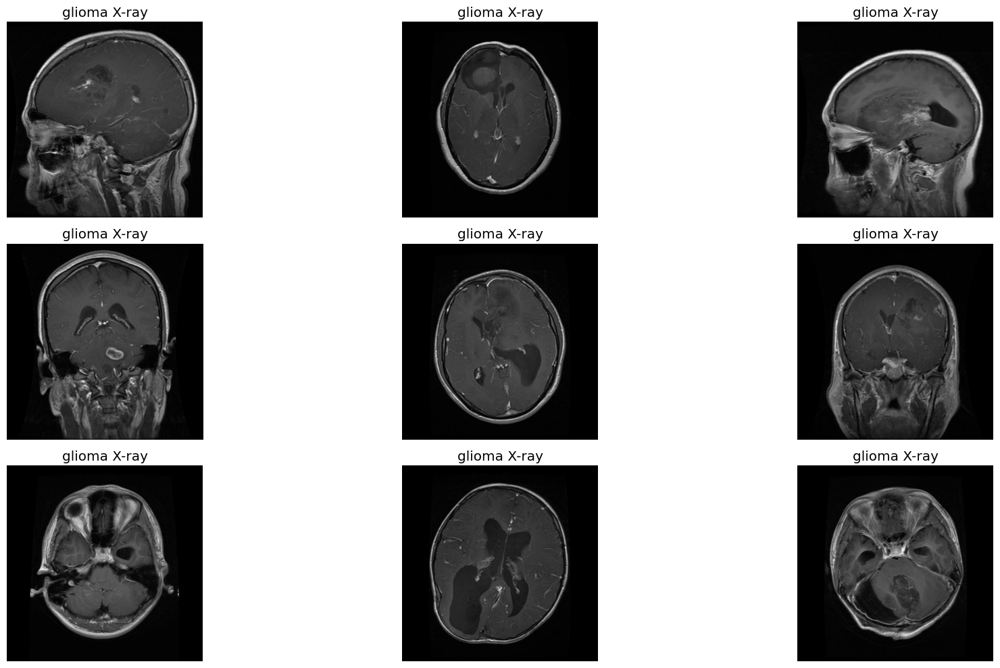

In [ ]:
plt.figure(figsize=(20, 10))

for i in range(9):
  plt.subplot(3, 3, i+1)
  img = plt.imread(os.path.join(glioma_dir, glioma[i]))
  plt.imshow(img, cmap='gray')
  plt.axis('off')
  plt.title("glioma X-ray")

plt.tight_layout()

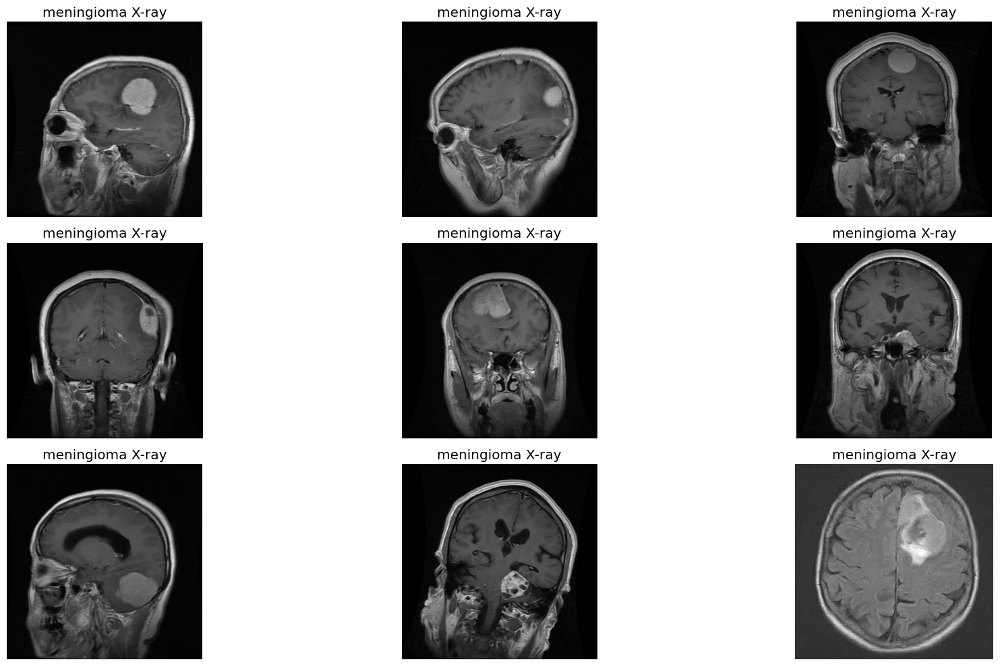

In [ ]:
meningioma = os.listdir("/content/BrainTumorDataset_Split/train/meningioma_tumor")
meningioma_dir = "/content/BrainTumorDataset_Split/train/meningioma_tumor"

plt.figure(figsize=(20, 10))

for i in range(9):
  plt.subplot(3, 3, i+1)
  img = plt.imread(os.path.join(meningioma_dir, meningioma[i]))
  plt.imshow(img, cmap='gray')
  plt.axis('off')
  plt.title("meningioma X-ray")

plt.tight_layout()

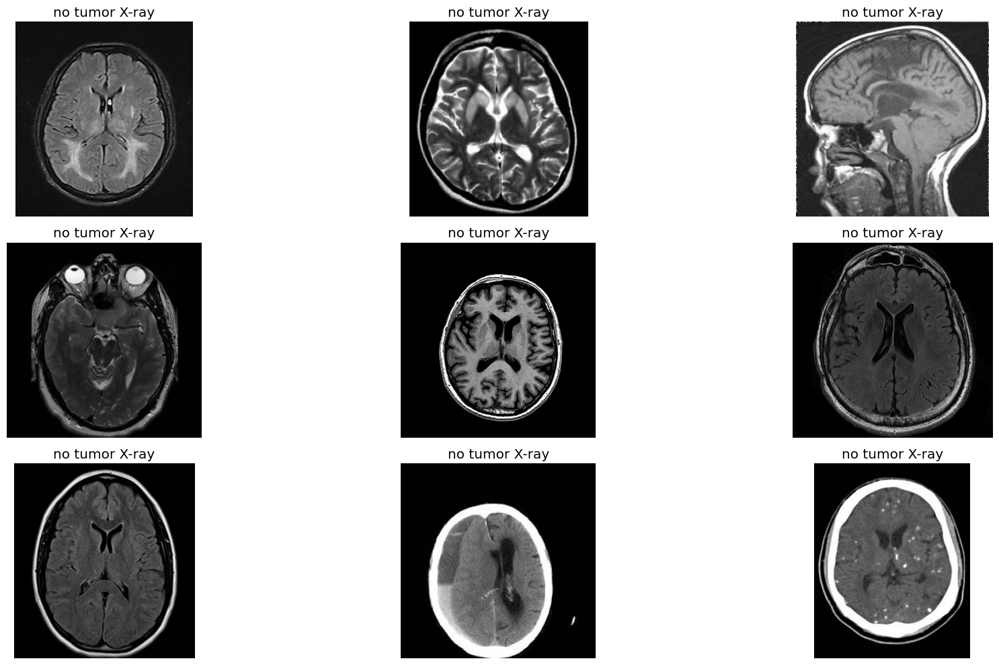

In [ ]:
no_tumor = os.listdir("/content/BrainTumorDataset_Split/train/no_tumor")
no_tumor_dir = "/content/BrainTumorDataset_Split/train/no_tumor"

plt.figure(figsize=(20, 10))

for i in range(9):
  plt.subplot(3, 3, i+1)
  img = plt.imread(os.path.join(no_tumor_dir, no_tumor[i]))
  plt.imshow(img, cmap='gray')
  plt.axis('off')
  plt.title("no tumor X-ray")

plt.tight_layout()

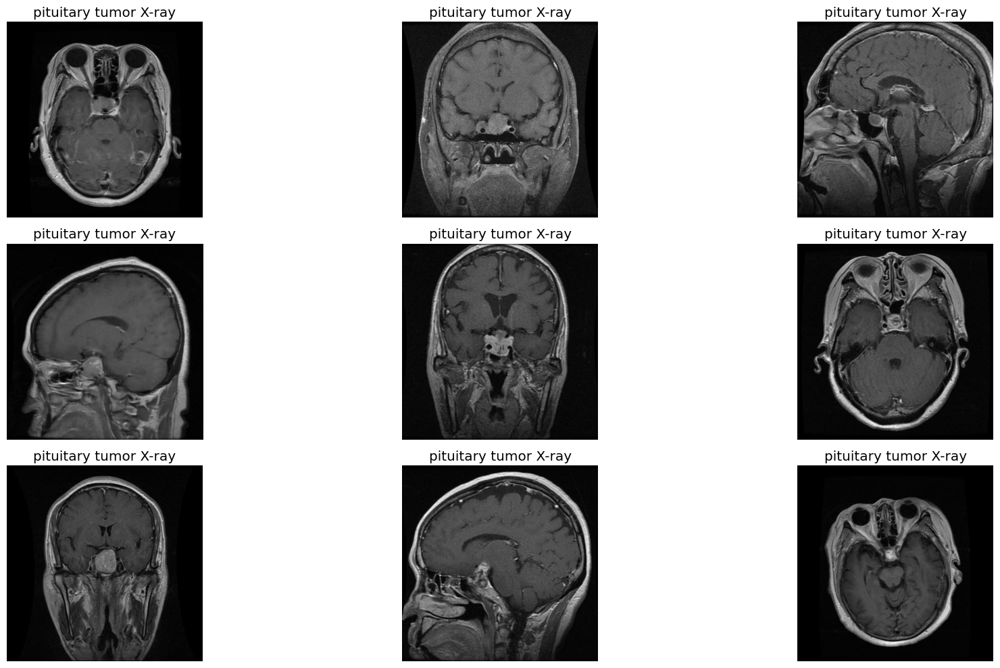

In [ ]:
pituitary = os.listdir("/content/BrainTumorDataset_Split/train/pituitary_tumor")
pituitary_dir = "/content/BrainTumorDataset_Split/train/pituitary_tumor"

plt.figure(figsize=(20, 10))

for i in range(9):
  plt.subplot(3, 3, i+1)
  img = plt.imread(os.path.join(pituitary_dir, pituitary[i]))
  plt.imshow(img, cmap='gray')
  plt.axis('off')
  plt.title("pituitary tumor X-ray")

plt.tight_layout()

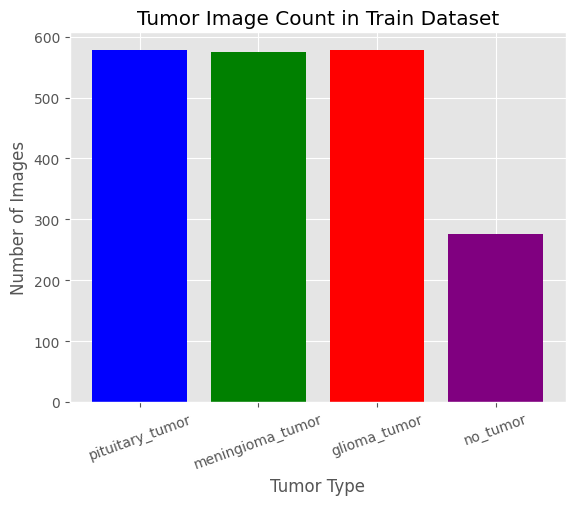

In [ ]:
import os
import matplotlib.pyplot as plt

train_dir = "BrainTumorDataset_Split/train"

categories = os.listdir(train_dir)
image_counts = [len(os.listdir(os.path.join(train_dir, cat))) for cat in categories]

plt.bar(categories, image_counts, color=["blue", "green", "red", "purple"])
plt.xlabel("Tumor Type")
plt.ylabel("Number of Images")
plt.title("Tumor Image Count in Train Dataset")
plt.xticks(rotation=20)
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, Dropout
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.optimizers import SGD, RMSprop, Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

In [ ]:
train_datagen = ImageDataGenerator(rescale= 1./255,
                                   horizontal_flip = 0.4,
                                   vertical_flip = 0.4,
                                   rotation_range = 40,
                                   shear_range = 0.2,
                                   width_shift_range=0.4,
                                   height_shift_range=0.4,
                                   fill_mode = "nearest")

valid_datagen = ImageDataGenerator(rescale=1./255)
test_dategen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory("/content/BrainTumorDataset_Split/train",
                                                    batch_size = 32,
                                                    target_size = (128, 128),
                                                    class_mode = 'categorical',
                                                    shuffle = True,
                                                    seed = 42,
                                                    color_mode = 'rgb')

valid_generator = valid_datagen.flow_from_directory("/content/BrainTumorDataset_Split/val",
                                                    batch_size = 32,
                                                    target_size = (128, 128),
                                                    class_mode = 'categorical',
                                                    shuffle = True,
                                                    seed = 42,
                                                    color_mode = 'rgb')

Found 2007 images belonging to 4 classes.
Found 429 images belonging to 4 classes.


In [ ]:
class_labels = train_generator.class_indices
class_labels

{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}

In [ ]:
class_name = {value:key for (key, value) in class_labels.items()}
class_name

{0: 'glioma_tumor', 1: 'meningioma_tumor', 2: 'no_tumor', 3: 'pituitary_tumor'}

## VGG 19

In [ ]:
# base_model = VGG19(input_shape=(128, 128, 3),
#                    include_top=False,
#                    weights='imagenet')
input_tensor = Input(shape=(128, 128, 3))

base_model = VGG19(input_tensor=input_tensor, include_top=False, weights='imagenet')

for layer in base_model.layers:
  layer.trainable = False

x = base_model.output

flat = Flatten()(x)

class_1 = Dense(4608, activation = 'relu')(flat)

dropout = Dropout(0.2)(class_1)

class_2 = Dense(1152, activation='relu')(dropout)

output = Dense(4, activation='softmax')(class_2)

model_01 = Model(base_model.inputs, output)

model_01.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 63,091,908 (240.68 MB)

 Trainable params: 43,067,524 (164.29 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [ ]:
filepath = "model.keras"
es = EarlyStopping(monitor="val_loss", verbose = 1, mode = "min", patience = 4)

cp = ModelCheckpoint(filepath, monitor = "val_loss", save_best_only=True, save_weights_only=False,mode="auto", save_freq="epoch")

lrr = ReduceLROnPlateau(monitor = "val_accuracy", patience=3, verbose = 1, factor=0.5, mil_lr = 0.0001)

sgd = SGD(learning_rate = 0.0001, decay = 1e-6, momentum = 0.1, nesterov = True)

model_01.compile(loss = 'categorical_crossentropy', optimizer = sgd, metrics=['accuracy'])

/usr/local/lib/python3.11/dist-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [ ]:
import math

num_train_samples = train_generator.samples
num_val_samples = valid_generator.samples

batch_size = 32  # Adjust
steps_per_epoch = math.ceil(num_train_samples / batch_size)
validation_steps = math.ceil(num_val_samples / batch_size)

history_01 = model_01.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=50,
    callbacks=[es, cp, lrr],
    validation_data=valid_generator,
    validation_steps=validation_steps
)


Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_55']
Received: inputs=Tensor(shape=(None, 128, 128, 3))
  warnings.warn(msg)


63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 299ms/step - accuracy: 0.2380 - loss: 1.4939 - val_accuracy: 0.3240 - val_loss: 1.3119 - learning_rate: 1.0000e-04
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - accuracy: 0.3193 - loss: 1.3724 - val_accuracy: 0.3776 - val_loss: 1.3019 - learning_rate: 1.0000e-04
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - accuracy: 0.3126 - loss: 1.3700 - val_accuracy: 0.4079 - val_loss: 1.2928 - learning_rate: 1.0000e-04
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 258ms/step - accuracy: 0.3304 - loss: 1.3489 - val_accuracy: 0.3939 - val_loss: 1.2862 - learning_rate: 1.0000e-04
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 264ms/step - accuracy: 0.3287 - loss: 1.3479 - val_accuracy: 0.3800 - val_loss: 1.2792 - learning_rate: 1.0000e-04
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - accuracy: 0.3268 - loss: 1.3352 - val_accuracy: 0.4429 - val_loss: 1.2679 - learning_rate: 1.0000e-04
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - accuracy: 0.33

In [ ]:
if not os.path.isdir('model_weights/'):
  os.mkdir("model_weights/")

model_01.save(filepath = "model_weights/vgg19_model_01.h5", overwrite=True)

In [ ]:
test_generator = test_dategen.flow_from_directory("/content/BrainTumorDataset_Split/test",
                                                    batch_size = 32,
                                                    target_size = (128, 128),
                                                    class_mode = 'categorical',
                                                    shuffle = True,
                                                    seed = 42,
                                                    color_mode = 'rgb')

Found 814 images belonging to 4 classes.


In [ ]:
model_01.load_weights("model_weights/vgg19_model_01.h5")

vgg_val_eval_01 = model_01.evaluate(valid_generator)

vagg_test_eval_01 = model_01.evaluate(test_generator)



14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - accuracy: 0.5149 - loss: 1.2150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 256ms/step - accuracy: 0.4334 - loss: 1.2774


In [ ]:
print(f"Validation loss: {vgg_val_eval_01[0]}")
print(f"Validation Accuracy: {vgg_val_eval_01[1]}")
print(f"Test Loss: {vagg_test_eval_01[0]}")
print(f"Test Accuracy: {vagg_test_eval_01[1]}")

Validation loss: 1.2106492519378662
Validation Accuracy: 0.49417248368263245
Test Loss: 1.2639530897140503
Test Accuracy: 0.43980345129966736


## Efficient Net

In [ ]:
from tqdm import tqdm

In [ ]:
import os

labels = ['glioma_tumor', 'no_tumor', 'meningioma_tumor', 'pituitary_tumor']
base_path = "/content/tumor/Training"

for label in labels:
    folderPath = os.path.join(base_path, label)
    if not os.path.exists(folderPath):
        print(f"Directory does not exist: {folderPath}")
    else:
        print(f"Directory exists: {folderPath}, contains {len(os.listdir(folderPath))} files")


Directory exists: /content/tumor/Training/glioma_tumor, contains 826 files
Directory exists: /content/tumor/Training/no_tumor, contains 395 files
Directory exists: /content/tumor/Training/meningioma_tumor, contains 822 files
Directory exists: /content/tumor/Training/pituitary_tumor, contains 827 files


In [ ]:
X_train = []
y_train = []
labels = ['glioma_tumor','no_tumor','meningioma_tumor','pituitary_tumor']
image_size = 150
for i in labels:
    folderPath = os.path.join('/content/tumor/Training',i)
    for j in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        img = cv2.resize(img,(image_size, image_size))
        X_train.append(img)
        y_train.append(i)

for i in labels:
    folderPath = os.path.join('/content/tumor/Testing',i)
    for j in tqdm(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        img = cv2.resize(img,(image_size,image_size))
        X_train.append(img)
        y_train.append(i)

X_train = np.array(X_train)
y_train = np.array(y_train)

100%|██████████| 74/74 [00:00<00:00, 319.63it/s]


In [ ]:
X_train.shape

(3264, 150, 150, 3)

In [ ]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X_train,y_train, test_size=0.1,random_state=101)

In [ ]:
y_train_new = []
for i in y_train:
    y_train_new.append(labels.index(i))
y_train = y_train_new
y_train = tf.keras.utils.to_categorical(y_train)


y_test_new = []
for i in y_test:
    y_test_new.append(labels.index(i))
y_test = y_test_new
y_test = tf.keras.utils.to_categorical(y_test)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint
from sklearn.metrics import classification_report,confusion_matrix

In [ ]:
effnet = EfficientNetB0(weights='imagenet',include_top=False,input_shape=(image_size,image_size,3))

In [ ]:
model = effnet.output
model = tf.keras.layers.GlobalAveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Dense(4,activation='softmax')(model)
model = tf.keras.models.Model(inputs=effnet.input, outputs = model)

In [ ]:
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8             │ (None, 150, 150, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_4 (Rescaling)   │ (None, 150, 150, 3)    │              0 │ input_layer_8[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_2           │ (None, 150, 150, 3)    │              7 │ rescaling_4[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_5 (Rescaling)   │ (None, 150, 150, 3)    │              0 │ normalization_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 151, 151, 3)    │              0 │ rescaling_5[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 75, 75, 32)     │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 75, 75, 32)     │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 75, 75, 32)     │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 75, 75, 32)     │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 75, 75, 32)     │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 75, 75, 32)     │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 4,054,695 (15.47 MB)

 Trainable params: 4,012,672 (15.31 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
model.compile(loss='categorical_crossentropy',optimizer = 'Adam', metrics= ['accuracy'])

In [ ]:
tensorboard = TensorBoard(log_dir = 'logs')
checkpoint = ModelCheckpoint("effnet.h5",monitor="val_accuracy",save_best_only=True,mode="auto",verbose=1)
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy', factor = 0.3, patience = 2, min_delta = 0.001,
                              mode='auto',verbose=1)

In [ ]:
history = model.fit(X_train,
                    y_train,
                    validation_split=0.1,
                    epochs =12,
                    verbose=1,
                    batch_size=32,
                    callbacks=[tensorboard,checkpoint,reduce_lr])

Epoch 1/12
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accuracy: 0.7393 - loss: 0.6587
Epoch 1: val_accuracy improved from -inf to 0.81973, saving model to effnet.h5


83/83 ━━━━━━━━━━━━━━━━━━━━ 146s 709ms/step - accuracy: 0.7404 - loss: 0.6564 - val_accuracy: 0.8197 - val_loss: 0.7189 - learning_rate: 0.0010
Epoch 2/12
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.9353 - loss: 0.1898
Epoch 2: val_accuracy improved from 0.81973 to 0.85374, saving model to effnet.h5


83/83 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - accuracy: 0.9352 - loss: 0.1901 - val_accuracy: 0.8537 - val_loss: 0.5251 - learning_rate: 0.0010
Epoch 3/12
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.9541 - loss: 0.1293
Epoch 3: val_accuracy improved from 0.85374 to 0.93878, saving model to effnet.h5


83/83 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - accuracy: 0.9542 - loss: 0.1291 - val_accuracy: 0.9388 - val_loss: 0.2238 - learning_rate: 0.0010
Epoch 4/12
82/83 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.9718 - loss: 0.0898
Epoch 4: val_accuracy did not improve from 0.93878
83/83 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9718 - loss: 0.0900 - val_accuracy: 0.7449 - val_loss: 0.9338 - learning_rate: 0.0010
Epoch 5/12
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.9763 - loss: 0.0805
Epoch 5: val_accuracy did not improve from 0.93878

Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
83/83 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.9763 - loss: 0.0805 - val_accuracy: 0.9150 - val_loss: 0.3367 - learning_rate: 0.0010
Epoch 6/12
82/83 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.9847 - loss: 0.0560
Epoch 6: val_accuracy improved from 0.93878 to 0.96259, saving model to effnet.h5


83/83 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accuracy: 0.9847 - loss: 0.0557 - val_accuracy: 0.9626 - val_loss: 0.1577 - learning_rate: 3.0000e-04
Epoch 7/12
82/83 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.9964 - loss: 0.0189
Epoch 7: val_accuracy improved from 0.96259 to 0.96599, saving model to effnet.h5


83/83 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.9964 - loss: 0.0188 - val_accuracy: 0.9660 - val_loss: 0.1214 - learning_rate: 3.0000e-04
Epoch 8/12
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.9967 - loss: 0.0095
Epoch 8: val_accuracy improved from 0.96599 to 0.97279, saving model to effnet.h5


83/83 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.9728 - val_loss: 0.1662 - learning_rate: 3.0000e-04
Epoch 9/12
82/83 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.9995 - loss: 0.0065
Epoch 9: val_accuracy improved from 0.97279 to 0.97619, saving model to effnet.h5


83/83 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - accuracy: 0.9995 - loss: 0.0065 - val_accuracy: 0.9762 - val_loss: 0.1402 - learning_rate: 3.0000e-04
Epoch 10/12
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 1.0000 - loss: 0.0039
Epoch 10: val_accuracy did not improve from 0.97619
83/83 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 1.0000 - loss: 0.0039 - val_accuracy: 0.9660 - val_loss: 0.1921 - learning_rate: 3.0000e-04
Epoch 11/12
82/83 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.9978 - loss: 0.0091
Epoch 11: val_accuracy did not improve from 0.97619

Epoch 11: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.
83/83 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9978 - loss: 0.0091 - val_accuracy: 0.9660 - val_loss: 0.1867 - learning_rate: 3.0000e-04
Epoch 12/12
82/83 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.9995 - loss: 0.0034
Epoch 12: val_accuracy did not improve from 0.97619
83/83 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9995 - loss: 0.0034 

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>